In [4]:
!unzip -q "archive.zip"

# QUESTION 1

### 1.1 Importing the Libraries

In this part, I import the main Python libraries that I will use throughout the assignment.  
- `pandas` and `numpy` will help me manage tabular data and numerical operations.  
- `matplotlib` and `seaborn` will be used for visualizations and plots.  
- `cv2` (OpenCV) will be used to read and process images.  
- `os` will help me navigate through the folder structure of the dataset.


In [2]:
import os

import numpy as np
import pandas as pd

import cv2
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline


In this step, I load all images from the **train** folder into a pandas DataFrame called `train_df`.  
For each image, I store:
- the full file path (`filepath`)
- the corresponding class label (`label`), which is given by the folder name.

In [5]:
base_dir = "/content/Skin cancer ISIC The International Skin Imaging Collaboration"
train_dir = os.path.join(base_dir, "Train")

records = []

for class_name in os.listdir(train_dir):
    class_folder = os.path.join(train_dir, class_name)

    for fname in os.listdir(class_folder):
        fpath = os.path.join(class_folder, fname)
        records.append({
            "filepath": fpath,
            "label": class_name
        })

train_df = pd.DataFrame(records)

train_df.head()

,filepath,label
0,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma
1,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma
2,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma
3,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma
4,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma


In [6]:
print("Total number of images in the training set:", len(train_df))
print("\nNumber of images per class:")
print(train_df["label"].value_counts())

Total number of images in the training set: 2239

Number of images per class:
label
pigmented benign keratosis    462
melanoma                      438
basal cell carcinoma          376
nevus                         357
squamous cell carcinoma       181
vascular lesion               139
actinic keratosis             114
dermatofibroma                 95
seborrheic keratosis           77
Name: count, dtype: int64


In [7]:
heights = []
widths = []
channels = []
filesizes = []

for path in train_df["filepath"]:
    img = cv2.imread(path)
    if img is None:
        heights.append(np.nan)
        widths.append(np.nan)
        channels.append(np.nan)
        filesizes.append(np.nan)
        continue

    h, w = img.shape[:2]
    c = 1 if img.ndim == 2 else img.shape[2]

    heights.append(h)
    widths.append(w)
    channels.append(c)

    filesizes.append(os.path.getsize(path))

train_df["height"] = heights
train_df["width"] = widths
train_df["channels"] = channels
train_df["filesize_bytes"] = filesizes

train_df.head()

,filepath,label,height,width,channels,filesize_bytes
0,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,450,600,3,270438
1,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,450,600,3,219575
2,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,450,600,3,331292
3,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,450,600,3,148557
4,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,450,600,3,146123


In [8]:
print(train_df["channels"].value_counts())

channels
3    2239
Name: count, dtype: int64


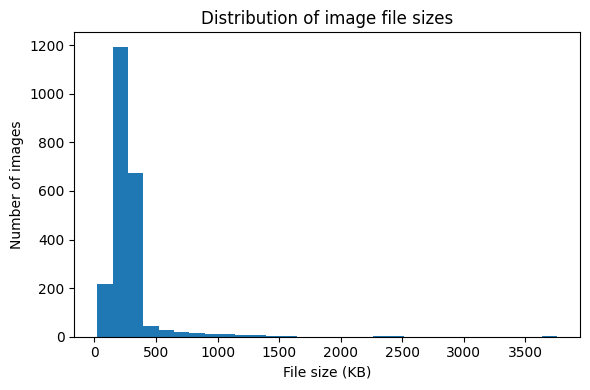

In [9]:
plt.figure(figsize=(6,4))
plt.hist(train_df["filesize_bytes"] / 1024, bins=30)
plt.xlabel("File size (KB)")
plt.ylabel("Number of images")
plt.title("Distribution of image file sizes")
plt.tight_layout()
plt.show()

In this section, I examined the basic characteristics of all images in the training dataset.  
First, I checked the number of channels across all 2,239 images. The result shows that *every* image has exactly **3 channels**, which confirms that the entire dataset consists of RGB color images. This is important because it ensures consistency when applying color-based processing techniques later in the assignment.

Next, I analyzed the file sizes of the images. The histogram shows a strong right-skewed distribution:  
- Most images fall within roughly **150–450 KB**, forming a dense peak in that region.  
- A smaller number of images extend toward higher sizes (up to around 3500 KB), but these are clear outliers.  
- The majority of the dataset is therefore relatively compact and uniform in size, which is beneficial for processing speed and memory usage in later steps.

Overall, the dataset appears to be well-structured and consistent, with stable channel counts and a predictable file-size distribution. This makes the dataset suitable for the image-processing tasks in the following sections.


# QUESTION 2

### 2.1 Random RGB and Grayscale Visualization

In this part, I randomly select 9 images from the training dataset.  
Each selected image is displayed in two formats:

- **RGB version** (as originally stored)
- **Grayscale version** (converted using OpenCV)

Displaying both versions side-by-side allows me to visually compare color information with its grayscale representation.  
This step will also help me better understand how color intensity transforms when converted into a single-channel grayscale image.


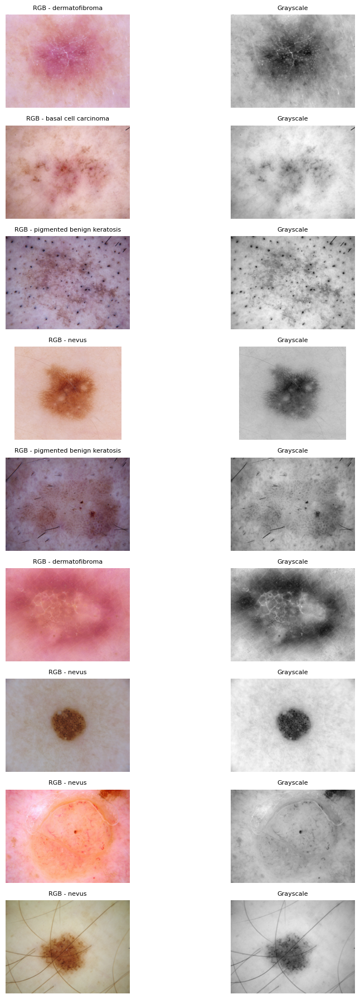

In [10]:
sample_df = train_df.sample(9, random_state=42).reset_index(drop=True)

plt.figure(figsize=(10, 18))

for i, row in sample_df.iterrows():
    img_bgr = cv2.imread(row["filepath"])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # RGB image
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"RGB - {row['label']}", fontsize=8)

    # Grayscale image
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_gray, cmap="gray")
    plt.axis("off")
    plt.title("Grayscale", fontsize=8)

plt.tight_layout()
plt.show()

In this section, I visualized 9 random images from the dataset in both RGB and grayscale formats.  
The RGB images display a wide range of lesion colors, including pink, brown, red, and dark pigmented areas. These color variations are important because they help differentiate between lesion types such as dermatofibroma, nevus, melanoma, and pigmented keratosis.

After converting the same images to grayscale, the visual emphasis shifts from color differences to structural and textural characteristics. For example:

- Pigmented regions appear much darker in grayscale, making the lesion boundaries more visible.  
- Reddish dermatofibroma regions become medium gray, reducing color-based contrast but highlighting internal texture.  
- Nevus lesions maintain a clear circular structure, which becomes even more pronounced in grayscale.

Overall, the grayscale images provide stronger visibility of texture, shape, and internal patterns, while the RGB images retain essential diagnostic color information. This comparison shows how color and grayscale representations complement each other in medical image analysis.

In [11]:
stats = []

for i, row in sample_df.iterrows():
    img_bgr = cv2.imread(row["filepath"])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    stats.append({
        "filepath": row["filepath"],
        "label": row["label"],

        # RGB statistics (combined across channels)
        "rgb_min":  img_rgb.min(),
        "rgb_max":  img_rgb.max(),
        "rgb_mean": img_rgb.mean(),
        "rgb_std":  img_rgb.std(),

        # Grayscale statistics
        "gray_min":  img_gray.min(),
        "gray_max":  img_gray.max(),
        "gray_mean": img_gray.mean(),
        "gray_std":  img_gray.std()
    })

stats_df = pd.DataFrame(stats)
stats_df

,filepath,label,rgb_min,rgb_max,rgb_mean,rgb_std,gray_min,gray_max,gray_mean,gray_std
0,/content/Skin cancer ISIC The International Sk...,dermatofibroma,62,255,181.391322,31.522716,98,230,176.884252,21.455418
1,/content/Skin cancer ISIC The International Sk...,basal cell carcinoma,1,244,180.642422,30.416353,13,223,180.061519,20.946992
2,/content/Skin cancer ISIC The International Sk...,pigmented benign keratosis,0,217,147.761711,24.677234,4,198,142.397696,21.637895
3,/content/Skin cancer ISIC The International Sk...,nevus,9,255,179.213149,43.150476,44,252,180.824000,32.811327
4,/content/Skin cancer ISIC The International Sk...,pigmented benign keratosis,0,229,117.074749,22.531714,1,186,112.179004,18.360078
5,/content/Skin cancer ISIC The International Sk...,dermatofibroma,60,244,153.870544,44.219801,95,198,148.719215,19.560209
6,/content/Skin cancer ISIC The International Sk...,nevus,12,188,152.545577,26.667685,30,178,152.702267,23.470868
7,/content/Skin cancer ISIC The International Sk...,nevus,0,255,187.230696,49.002421,50,255,187.244869,19.775074
8,/content/Skin cancer ISIC The International Sk...,nevus,11,255,164.373313,33.599677,19,230,169.841508,26.978557


In this section, I computed basic statistical properties (minimum, maximum, mean, and standard deviation) for both RGB and grayscale versions of the 9 randomly selected images. The results show several consistent patterns:

1. **RGB images generally have slightly higher variance**  
   For most samples, the RGB standard deviation is larger than the grayscale standard deviation.  
   This makes sense because RGB images contain three separate color channels, each contributing additional variation.  
   For example:
   - One nevus image has an RGB standard deviation of **49.0**, while its grayscale version drops to **19.8**.
   - Dermatofibroma and pigmented keratosis images show similar reductions.

2. **Mean pixel intensities remain relatively similar between RGB and grayscale**  
   The grayscale mean is often close to the RGB mean (e.g., 180.06 vs. 180.64 for a basal cell carcinoma image).  
   This indicates that the grayscale conversion preserves the overall brightness, even though it compresses the color information into a single channel.

3. **Minimum and maximum values become more constrained in grayscale**  
   Several images show:
   - RGB min = 0 or very low,
   - but grayscale min is noticeably higher (e.g., 0 → 19, 1 → 30).  
   This occurs because grayscale conversion blends all three channels, reducing extreme values.  
   Similarly, grayscale max values are slightly lower than RGB max values, except when the RGB image already has bright uniform regions.

4. **Lesion types show different statistical characteristics**  
   - **Nevus images** tend to have higher contrast (larger standard deviation), reflecting strong dark–light transitions typical of moles.  
   - **Pigmented benign keratosis** images show lower overall brightness and slightly lower grayscale variance.
   - **Dermatofibroma** tends to have brighter and more uniform regions, reflected by relatively lower grayscale standard deviation values.

Overall, these statistics demonstrate that RGB images carry more variability due to color information, while grayscale images provide a smoother and more compressed representation of pixel intensities. These differences will play an important role in the upcoming sections, especially in histogram analysis and contrast enhancement.

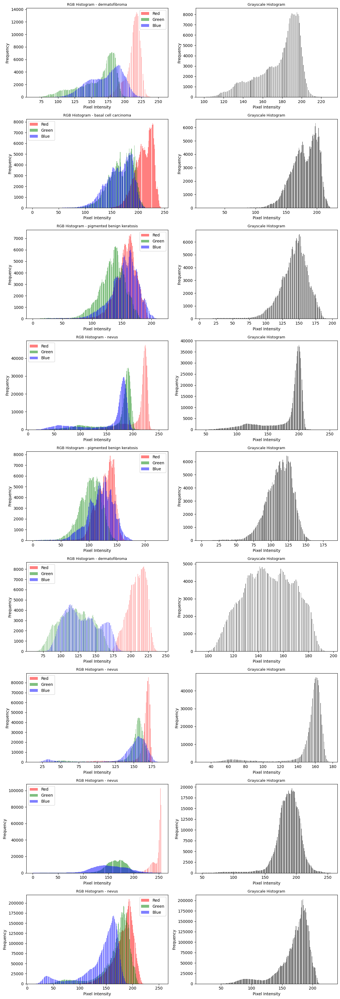

In [12]:
plt.figure(figsize=(12, 35))

for i, row in sample_df.iterrows():
    img_bgr = cv2.imread(row["filepath"])
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # --- RGB HISTOGRAM ---
    plt.subplot(9, 2, 2*i + 1)

    # Red channel
    plt.hist(img_rgb[:,:,0].ravel(), bins=256, color='red', alpha=0.5, label='Red')
    # Green channel
    plt.hist(img_rgb[:,:,1].ravel(), bins=256, color='green', alpha=0.5, label='Green')
    # Blue channel
    plt.hist(img_rgb[:,:,2].ravel(), bins=256, color='blue', alpha=0.5, label='Blue')

    plt.title(f"RGB Histogram - {row['label']}", fontsize=9)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    # --- GRAYSCALE HISTOGRAM ---
    plt.subplot(9, 2, 2*i + 2)
    plt.hist(img_gray.ravel(), bins=256, color='gray')
    plt.title("Grayscale Histogram", fontsize=9)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

Across all nine RGB histograms, the three color channels (Red, Green, and Blue) show clearly separated distributions, reflecting the natural pigmentation patterns of skin and lesions:

1. **Separation of RGB Channels**
   - The **Red channel** consistently shows the highest intensity values, often peaking between **200–255**.  
     This is expected for dermoscopic images, since skin typically contains strong reddish and pinkish components.
   - The **Green channel** peaks at mid–high intensity levels, usually in the **150–200** range.  
     Its distribution is broader and smoother than the red channel.
   - The **Blue channel** is the lowest among the three, with peaks usually between **100–170**.  
     This reflects weaker blue reflectance in human skin.
   
   Overall, the RGB channels are well separated, with Red > Green > Blue in terms of both peak position and intensity range.

2. **Grayscale Histogram Concentration**
   The grayscale histograms for all images tend to concentrate around **mid to high intensities**, typically between **140–200**.  
   Some images exhibit a narrow peak (e.g., nevus lesions with uniform bright background), while others have a wider distribution (e.g., pigmented keratosis with strong textural variation).  
   Very dark or very bright extremes are generally rare, indicating that the dataset predominantly contains moderately illuminated skin images.

3. **Effect of RGB → Grayscale Conversion**
   Converting from RGB to grayscale compresses the three color channels into a single intensity distribution.  
   As a result:
   - The grayscale histograms lose the channel-specific peaks seen in RGB (especially the dominant red peak).
   - The distributions become **smoother and less variable**, reflecting the averaging effect of luminance conversion.
   - Extreme values (very dark or very bright pixels) are reduced because the grayscale computation blends R, G, and B values.
   - Lesion structures become more distinguishable in grayscale because texture contrasts remain, while color differences are removed.

In summary, RGB histograms highlight how different color channels contribute uniquely to skin lesion appearance, while grayscale histograms show a more uniform and compressed tonal distribution. This demonstrates how grayscale conversion simplifies the intensity structure of the image while preserving essential contrast for analysis.

# QUESTION 3

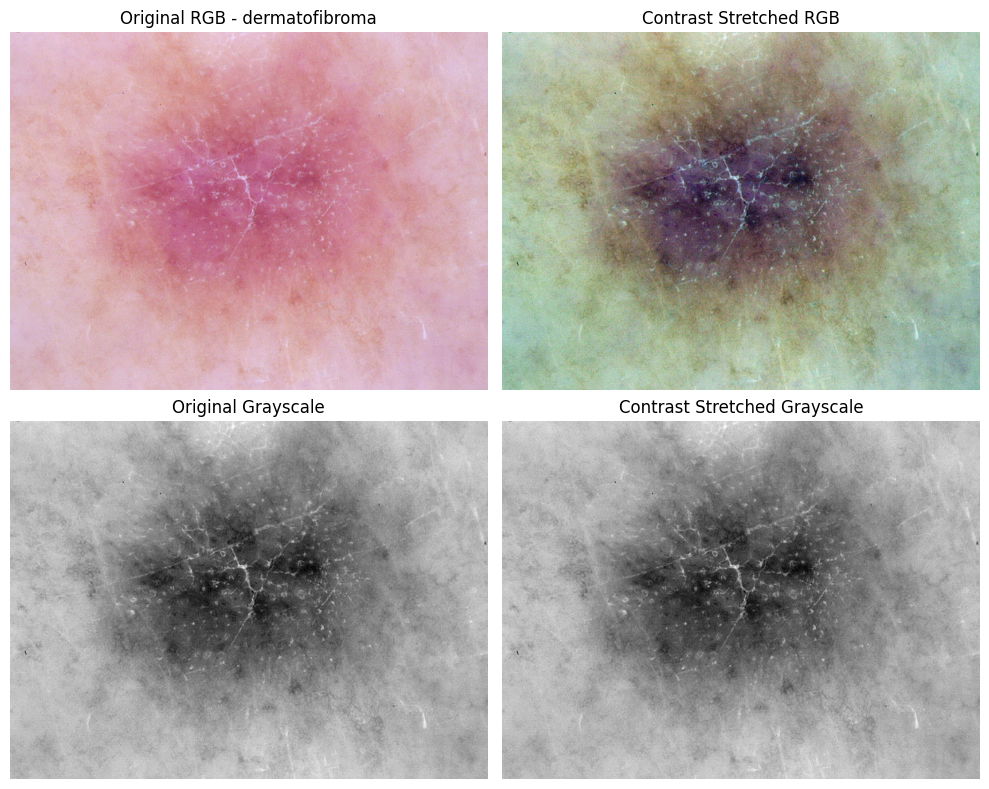

In [13]:
row = sample_df.iloc[0]
img_bgr = cv2.imread(row["filepath"])
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

def contrast_stretch(img):
    """Apply min-max contrast stretching to [0, 255]."""
    img = img.astype(np.float32)
    min_val = img.min()
    max_val = img.max()
    stretched = (img - min_val) * 255.0 / (max_val - min_val + 1e-8)
    return np.clip(stretched, 0, 255).astype(np.uint8)

# RGB: stretch each channel separately
rgb_stretched = np.zeros_like(img_rgb)
for c in range(3):
    rgb_stretched[:,:,c] = contrast_stretch(img_rgb[:,:,c])

# Grayscale stretching
gray_stretched = contrast_stretch(img_gray)

# --- Show results ---
plt.figure(figsize=(10,8))

plt.subplot(2,2,1)
plt.imshow(img_rgb)
plt.title(f"Original RGB - {row['label']}")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(rgb_stretched)
plt.title("Contrast Stretched RGB")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(img_gray, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(gray_stretched, cmap="gray")
plt.title("Contrast Stretched Grayscale")
plt.axis("off")

plt.tight_layout()
plt.show()

In this section, contrast stretching produced a very noticeable change in both RGB and grayscale versions of the image.  
In the **RGB result**, the overall color distribution shifted significantly:  
- The stretched image appears darker and more intense, especially around the central lesion.  
- The reddish and pink tones of the original dermatofibroma have transformed into deeper purples and browns due to the expansion of low-intensity values.  
- Subtle texture details that were barely visible in the original RGB image now stand out much more clearly.

This strong shift occurs because contrast stretching expands each channel independently, causing non-linear changes in color balance even though the transformation is linear per channel.

In the **grayscale version**, the contrast enhancement is more controlled.  
- Dark structures in the center of the lesion become more pronounced.  
- The background skin texture gains additional clarity without overly distorting the appearance.  
- The dynamic range of bright and dark regions is widened, giving the lesion stronger visual separation from the surrounding tissue.

Overall, contrast stretching increases global contrast in both formats, but the effect is much more dramatic in RGB due to channel-wise stretching.  
The grayscale result provides a more stable and diagnostically useful enhancement, whereas the RGB version may require careful interpretation because the colors can shift away from their natural appearance.

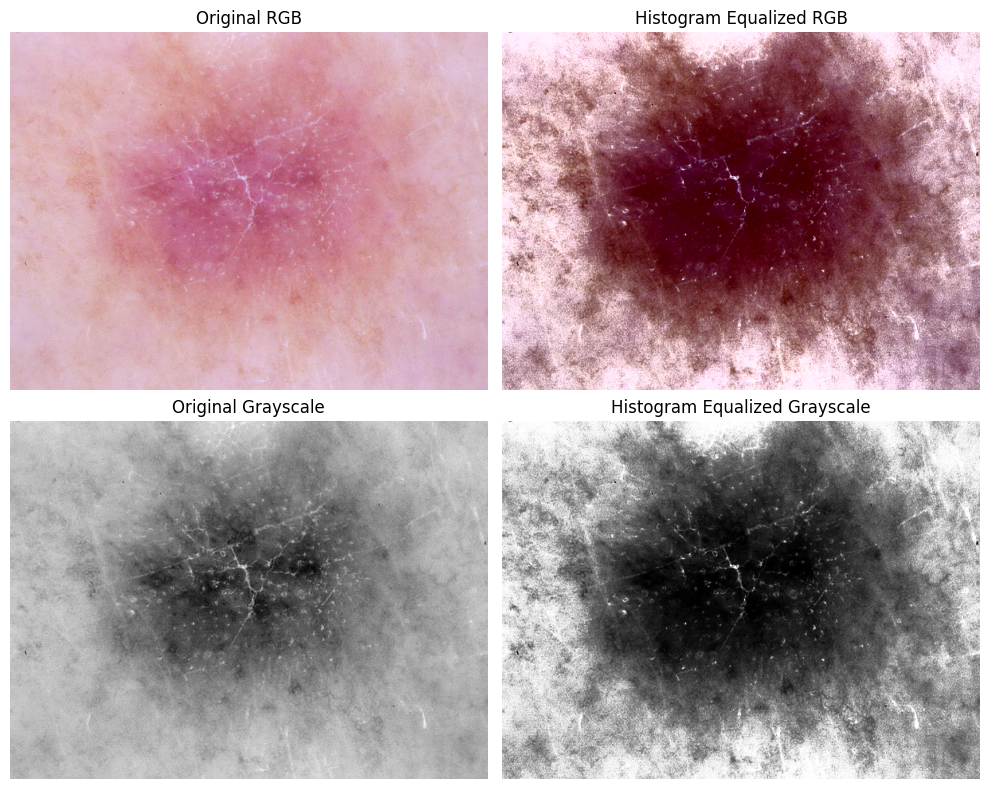

In [14]:
# --- RGB: Histogram Equalization on Y channel in YCrCb ---

img_ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
y, cr, cb = cv2.split(img_ycrcb)

# equalize only Y
y_eq = cv2.equalizeHist(y)

img_ycrcb_eq = cv2.merge([y_eq, cr, cb])
img_bgr_eq = cv2.cvtColor(img_ycrcb_eq, cv2.COLOR_YCrCb2BGR)
img_rgb_eq = cv2.cvtColor(img_bgr_eq, cv2.COLOR_BGR2RGB)

# --- Grayscale equalization ---
gray_eq = cv2.equalizeHist(img_gray)

# Visualization
plt.figure(figsize=(10,8))

plt.subplot(2,2,1)
plt.imshow(img_rgb)
plt.title("Original RGB")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(img_rgb_eq)
plt.title("Histogram Equalized RGB")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(img_gray, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(gray_eq, cmap="gray")
plt.title("Histogram Equalized Grayscale")
plt.axis("off")

plt.tight_layout()
plt.show()

The results of histogram equalization show a very strong contrast enhancement in both RGB and grayscale versions of the image.  
However, the effect is much more dramatic in the RGB result due to the transformation of the luminance channel in the YCrCb space.

In the **RGB equalized image**, the overall appearance becomes significantly darker and more intense.  
- The central lesion, which originally had soft pink and red tones, turns into deep purple and brown shades.  
- Texture patterns inside the lesion become far more pronounced, making structural boundaries very visible.  
- At the same time, the background skin tone appears uneven and overly contrasted, giving the image a somewhat harsh, high-contrast look.

This occurs because equalizing the Y (luminance) channel redistributes brightness aggressively across the entire range, amplifying already-dark regions and compressing bright areas.  
As a result, although lesion details become clearer, the natural color balance of the skin is noticeably distorted.

In the **grayscale equalized image**, the enhancement is visually more controlled and clinically more meaningful:  
- Dark components inside the lesion stand out strongly against the lighter background.  
- Fine structures such as streaks and texture variations become more visible.  
- The contrast improvement helps reveal low-intensity details that were less noticeable in the original grayscale image.

Overall, histogram equalization is highly effective for enhancing internal structure and contrast, especially in grayscale.  
However, in RGB images it may introduce unnatural coloration and uneven illumination, so its use should be carefully evaluated for medical imaging tasks where color accuracy is important.

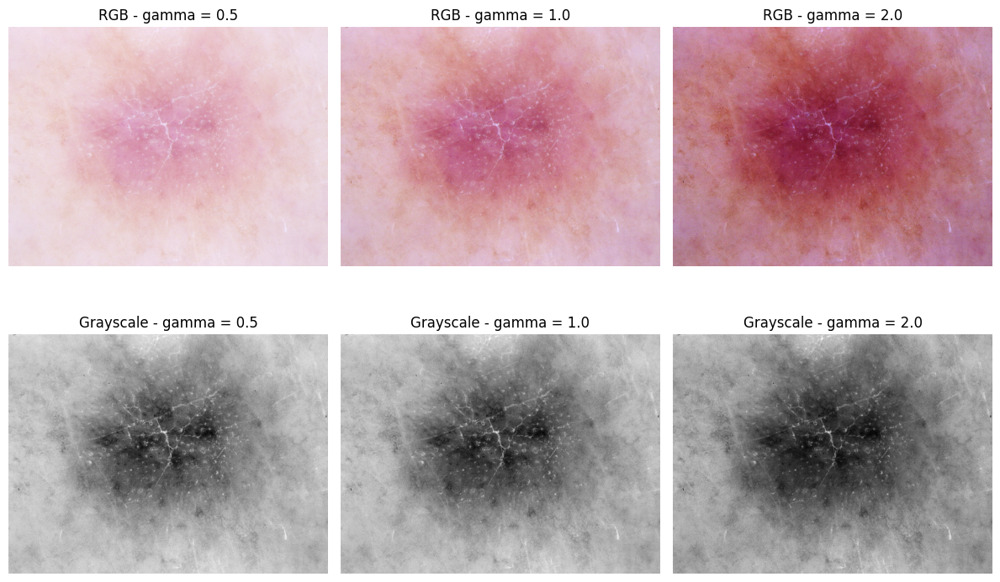

In [15]:
def gamma_correction(img, gamma):
    """Apply gamma correction with a given gamma value."""
    img_norm = img.astype(np.float32) / 255.0      # [0,1] aralığına çek
    corrected = np.power(img_norm, gamma)          # gamma uygula
    corrected = np.clip(corrected * 255.0, 0, 255) # geri [0,255]
    return corrected.astype(np.uint8)

gammas = [0.5, 1.0, 2.0]

# RGB gamma correction
rgb_gamma_images = [gamma_correction(img_rgb, g) for g in gammas]

# Grayscale gamma correction
gray_gamma_images = [gamma_correction(img_gray, g) for g in gammas]

# Show results
plt.figure(figsize=(12, 8))

# RGB row
for i, g in enumerate(gammas):
    plt.subplot(2, 3, i + 1)
    plt.imshow(rgb_gamma_images[i])
    plt.title(f"RGB - gamma = {g}")
    plt.axis("off")

# Grayscale row
for i, g in enumerate(gammas):
    plt.subplot(2, 3, i + 4)
    plt.imshow(gray_gamma_images[i], cmap="gray")
    plt.title(f"Grayscale - gamma = {g}")
    plt.axis("off")

plt.tight_layout()
plt.show()

The gamma correction results show a clear and predictable transformation in both the RGB and grayscale images, with each gamma value influencing brightness and contrast in different ways.

For the **RGB images**, the effects are visually distinct:
- With **γ = 0.5**, the image becomes noticeably brighter.  
  The lesion appears softer and less contrasted, and some darker structural details become partially washed out.  
  This makes the overall skin appear pale and reduces the visual depth of the central region.
- With **γ = 1.0**, the image remains unchanged and serves as the reference.
- With **γ = 2.0**, the image becomes darker and more saturated.  
  The reddish tones intensify, and the lesion’s core region becomes deeper and more pronounced.  
  This produces stronger visual contrast but may also obscure low-intensity features in the brighter areas.

For the **grayscale images**, the intensity shifts follow a similar pattern:
- **γ = 0.5** brightens the entire image uniformly, making the background lighter but reducing contrast around the lesion.
- **γ = 2.0** darkens the majority of the image while preserving bright streaks and structures inside the lesion.  
  This makes the lesion stand out more clearly but suppresses some softer details in low-intensity regions.

Overall, gamma correction provides a controlled way to emphasize either darker or brighter regions depending on the chosen gamma value.  
Values less than 1 (γ < 1) highlight dark areas and reveal shadowed structures, while values greater than 1 (γ > 1) emphasize bright regions and deepen contrast.  
These transformations can be useful in dermoscopic analysis, but they must be applied carefully to avoid unintentionally masking important diagnostic features.

# QUESTION 4

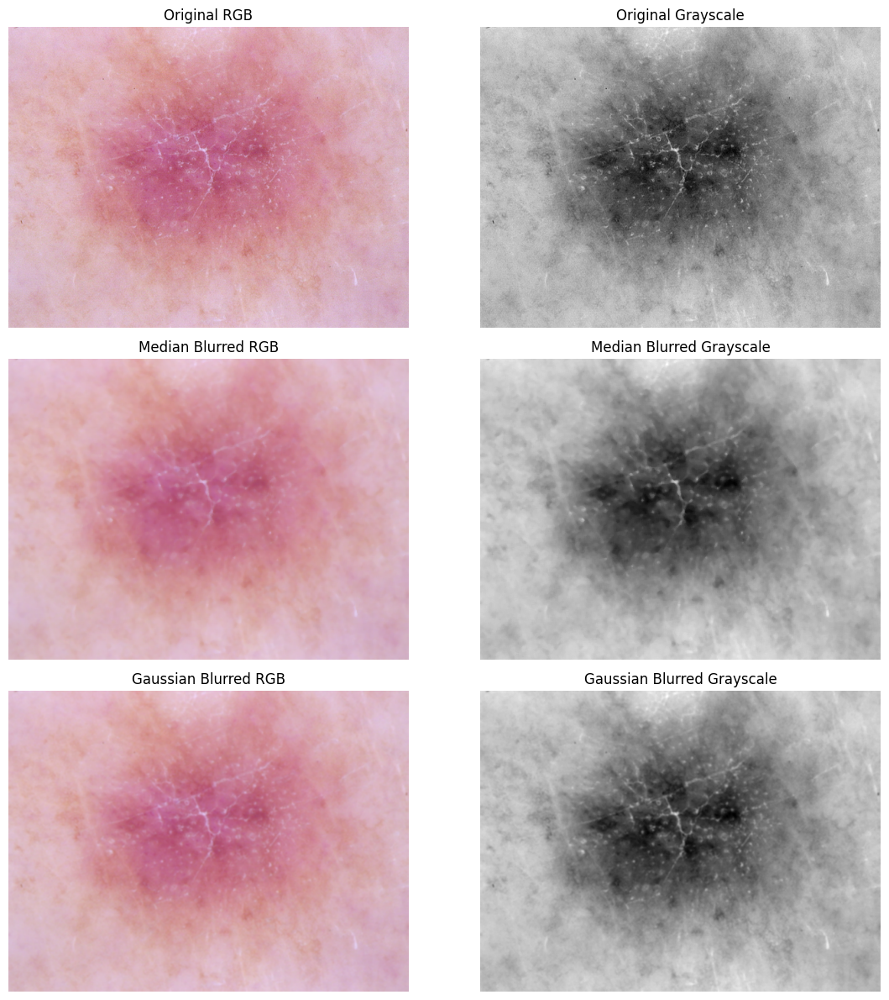

In [18]:
# Median blur (k=5)
median_rgb = cv2.medianBlur(img_rgb, 5)
median_gray = cv2.medianBlur(img_gray, 5)

# Gaussian blur (k=5, sigmaX=0)
gaussian_rgb = cv2.GaussianBlur(img_rgb, (5, 5), 0)
gaussian_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)

plt.figure(figsize=(12, 12))

# ---------------- RGB column ----------------
plt.subplot(3, 2, 1)
plt.imshow(img_rgb)
plt.title("Original RGB")
plt.axis("off")

plt.subplot(3, 2, 3)
plt.imshow(median_rgb)
plt.title("Median Blurred RGB")
plt.axis("off")

plt.subplot(3, 2, 5)
plt.imshow(gaussian_rgb)
plt.title("Gaussian Blurred RGB")
plt.axis("off")

# ---------------- Grayscale column ----------------
plt.subplot(3, 2, 2)
plt.imshow(img_gray, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(3, 2, 4)
plt.imshow(median_gray, cmap="gray")
plt.title("Median Blurred Grayscale")
plt.axis("off")

plt.subplot(3, 2, 6)
plt.imshow(gaussian_gray, cmap="gray")
plt.title("Gaussian Blurred Grayscale")
plt.axis("off")

plt.tight_layout()
plt.show()

When comparing the two smoothing techniques, there are clear differences in how they affect the lesion and surrounding skin texture. The **median blur preserves edges more effectively** in both RGB and grayscale images. Fine boundary lines inside the lesion, as well as small structural patterns, remain more visible because median filtering replaces each pixel with the median of its neighborhood, which prevents strong blurring across sharp intensity transitions.

On the other hand, the **Gaussian blur introduces a smoother and more uniform appearance**, which results in a noticeable loss of fine detail. The lesion becomes more diffused, and subtle internal textures—especially the fine streaks and small local variations—are partially washed out. This is because Gaussian filtering weights the center pixel more heavily but still averages surrounding values, leading to a soft blending effect.

Overall, median blur is more effective at reducing noise while maintaining edge information, whereas Gaussian blur provides stronger smoothing but at the cost of losing structural details.

# QUESTION 5

Random rotation angle: 2.845367545878148


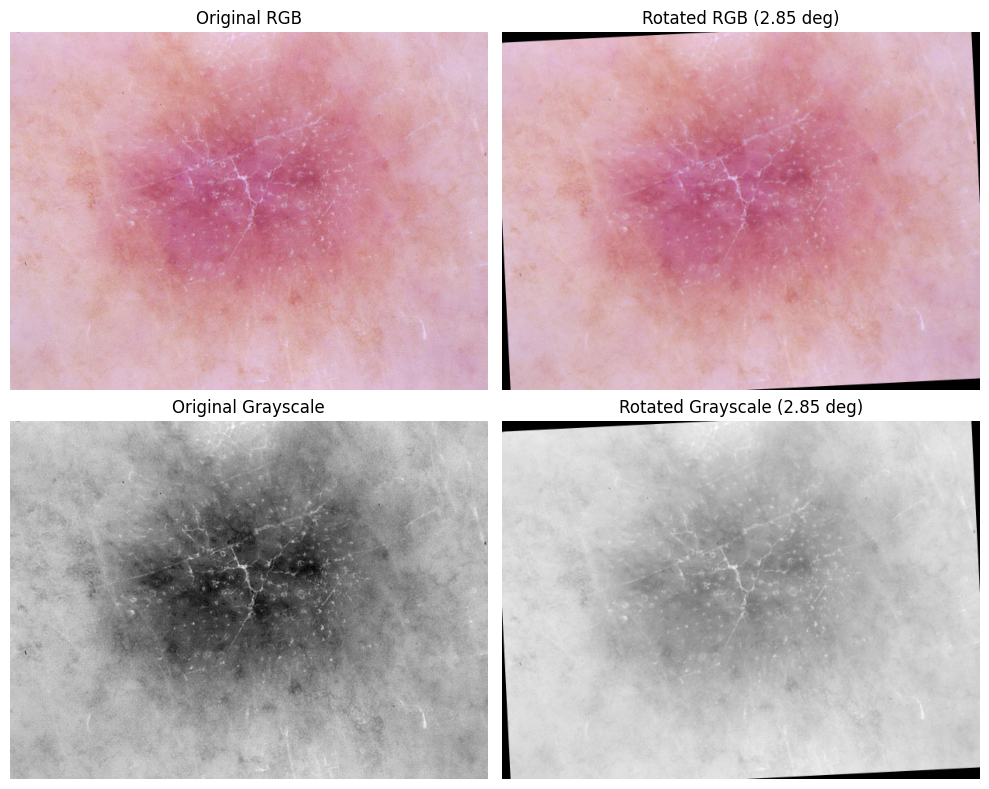

In [21]:
angle = np.random.uniform(0, 10)
print("Random rotation angle:", angle)

h, w = img_rgb.shape[:2]
center = (w // 2, h // 2)

M = cv2.getRotationMatrix2D(center, angle, 1.0)

rot_rgb = cv2.warpAffine(img_rgb, M, (w, h))
rot_gray = cv2.warpAffine(img_gray, M, (w, h))

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title("Original RGB")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(rot_rgb)
plt.title(f"Rotated RGB ({angle:.2f} deg)")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(img_gray, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(rot_gray, cmap="gray")
plt.title(f"Rotated Grayscale ({angle:.2f} deg)")
plt.axis("off")

plt.tight_layout()
plt.show()

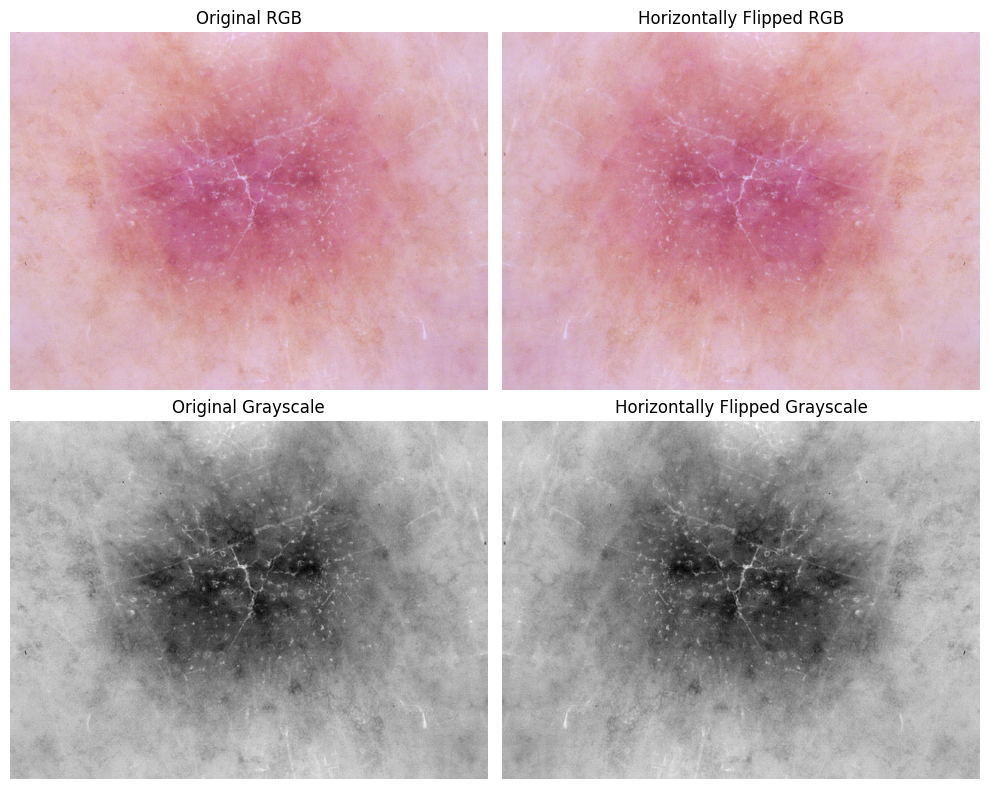

In [22]:
flip_rgb = cv2.flip(img_rgb, 1)
flip_gray = cv2.flip(img_gray, 1)

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title("Original RGB")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(flip_rgb)
plt.title("Horizontally Flipped RGB")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(img_gray, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(flip_gray, cmap="gray")
plt.title("Horizontally Flipped Grayscale")
plt.axis("off")

plt.tight_layout()
plt.show()

In this example, the horizontal flip produces a mirrored version of the lesion while preserving all visual characteristics. The central pink-purple lesion remains the main focus, and the surrounding light skin texture is unchanged except for the left–right inversion.

One noticeable aspect is that the lesion has a slightly asymmetrical distribution of darker structures: in the original image, the deeper purple region and some of the darker streaks appear more pronounced on the left side of the lesion. After flipping, these darker regions appear on the right side. This confirms that the flip transformation does not modify intensity or contrast—it simply relocates visual features to the opposite side of the image.

In the grayscale images, the same mirrored behavior is visible. The dense dark core of the lesion shifts horizontally, while the lighter peripheral tissue pattern remains intact. Fine structural details, such as the branching white lines across the lesion, also move to the opposite side but maintain the same sharpness and tonal distribution.

Overall, the horizontal flip preserves all diagnostic and structural information of the lesion while only changing its spatial orientation. This demonstrates that flipping can augment the dataset without altering clinically relevant features such as texture, pigmentation, or lesion boundaries.

#QUESTION 6

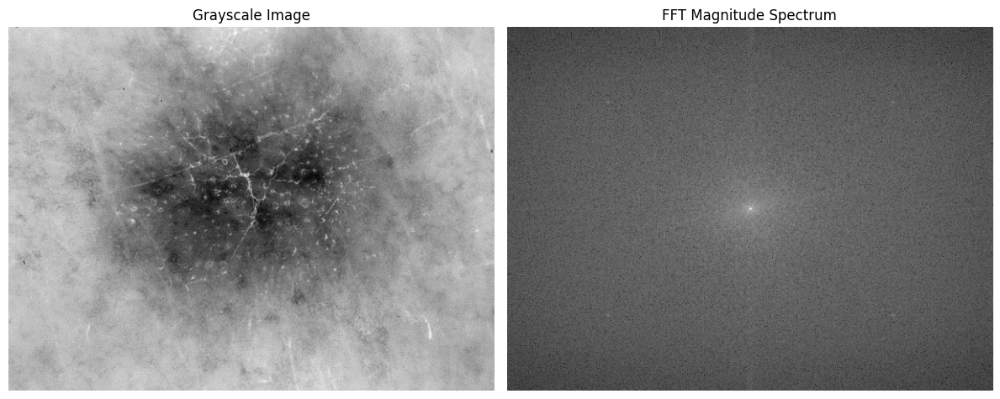

In [25]:
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# FFT
f = np.fft.fft2(gray)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title("FFT Magnitude Spectrum")
plt.axis("off")

plt.tight_layout()
plt.show()

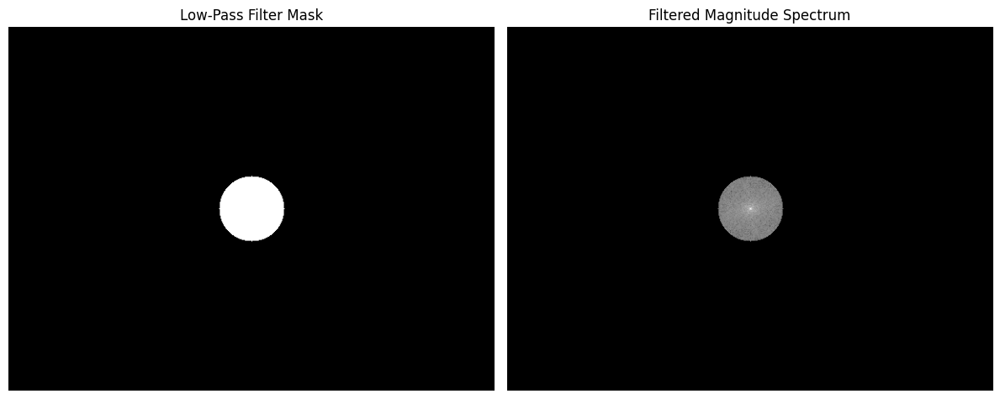

In [26]:
rows, cols = gray.shape
crow, ccol = rows // 2, cols // 2

# radius for low-pass filter (change radius for stronger/weaker blur)
radius = 40

# Create mask
mask = np.zeros((rows, cols), np.uint8)
cv2.circle(mask, (ccol, crow), radius, 1, -1)

# Apply mask in frequency domain
fshift_filtered = fshift * mask

magnitude_spectrum_filtered = 20 * np.log(np.abs(fshift_filtered) + 1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(mask, cmap='gray')
plt.title("Low-Pass Filter Mask")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum_filtered, cmap='gray')
plt.title("Filtered Magnitude Spectrum")
plt.axis("off")

plt.tight_layout()
plt.show()

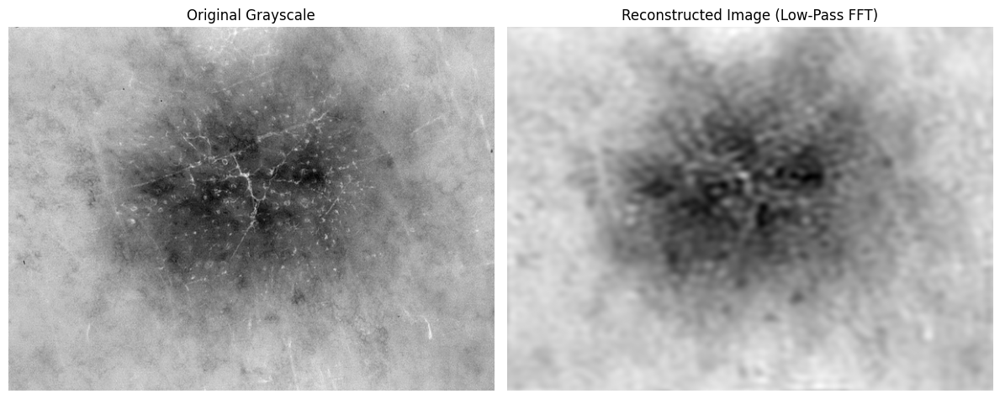

In [27]:
# 6.3 – Inverse FFT
f_ishift = np.fft.ifftshift(fshift_filtered)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

# 6.4 – Karşılaştırma görseli: orijinal vs low-pass (FFT sonucu)
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_back, cmap='gray')
plt.title("Reconstructed Image (Low-Pass FFT)")
plt.axis("off")

plt.tight_layout()
plt.show()

The low-pass filtered reconstruction shows a pronounced loss of fine structural detail compared to the original grayscale image. High-frequency components—such as the thin white streaks, sharp texture variations, and small granular patterns inside the lesion—are greatly suppressed. As a result, the reconstructed image appears much smoother, with only the broad intensity gradients and general shape of the lesion remaining visible.

While the original grayscale image displays complex, high-frequency dermoscopic structures, the low-pass FFT output retains only the coarse, low-frequency information. This confirms that the applied filter effectively removes sharp transitions and emphasizes the overall luminance distribution rather than detailed texture. The comparison highlights how frequency-domain filtering can isolate global patterns at the expense of diagnostic fine details.

# QUESTION 7

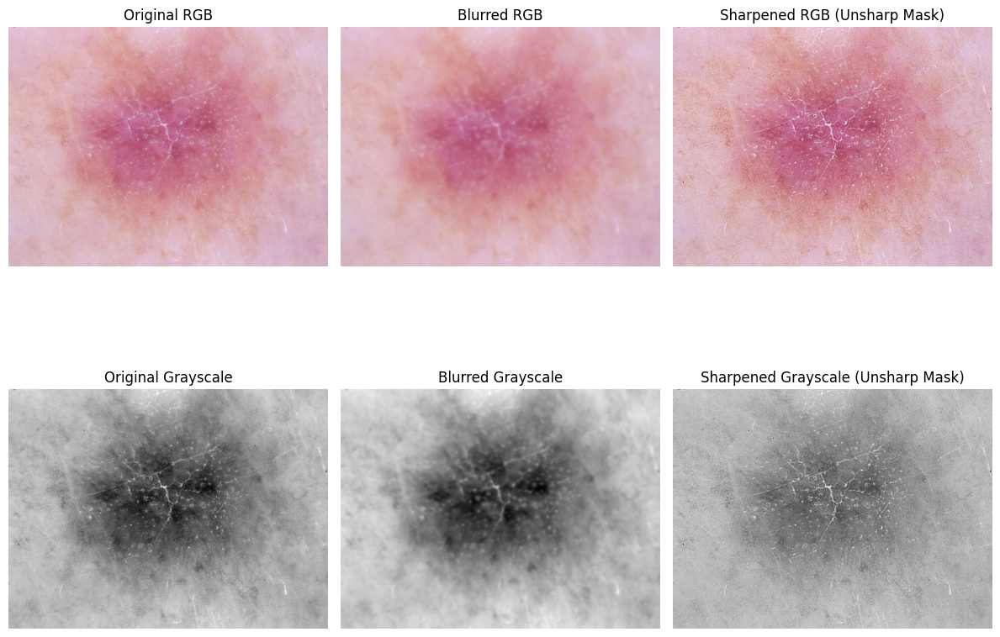

In [28]:
blur_kernel = (9, 9)
alpha = 1.5  # sharpening strength

# --- RGB sharpening ---
blur_rgb = cv2.GaussianBlur(img_rgb, blur_kernel, 0)
mask_rgb = cv2.subtract(img_rgb, blur_rgb)
sharp_rgb = cv2.addWeighted(img_rgb, 1 + alpha, blur_rgb, -alpha, 0)

# --- Grayscale sharpening ---
blur_gray = cv2.GaussianBlur(img_gray, blur_kernel, 0)
mask_gray = cv2.subtract(img_gray, blur_gray)
sharp_gray = cv2.addWeighted(img_gray, 1 + alpha, blur_gray, -alpha, 0)

plt.figure(figsize=(12, 10))

# RGB
plt.subplot(2, 3, 1)
plt.imshow(img_rgb)
plt.title("Original RGB")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(blur_rgb)
plt.title("Blurred RGB")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(sharp_rgb)
plt.title("Sharpened RGB (Unsharp Mask)")
plt.axis("off")

# Grayscale
plt.subplot(2, 3, 4)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(blur_gray, cmap='gray')
plt.title("Blurred Grayscale")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(sharp_gray, cmap='gray')
plt.title("Sharpened Grayscale (Unsharp Mask)")
plt.axis("off")

plt.tight_layout()
plt.show()

In the RGB results, unsharp masking clearly enhances the fine structural patterns around the lesion. The central pink-purple region becomes more defined, and the thin white streaks radiating outward gain noticeable clarity. Compared to the blurred RGB image, the sharpened version restores edge contrast and increases local color variation, giving the lesion a more textured and diagnostically informative appearance. However, the sharpening also slightly intensifies color saturation in some peripheral regions, which is a typical side effect of unsharp masking.

In the grayscale results, the effect is even more pronounced. The sharpened grayscale image reveals fine branching structures and localized intensity variations that appear softened in the blurred version. The central dark core of the lesion becomes more distinct, and the surrounding lighter tissue shows clearer boundaries. Unlike the RGB case, the grayscale sharpening produces a more controlled enhancement without introducing color artifacts.

Overall, unsharp masking effectively recovers high-frequency detail and emphasizes edges in both RGB and grayscale images. The grayscale version provides a cleaner structural enhancement, while the RGB version offers stronger texture recovery at the cost of mild color amplification.

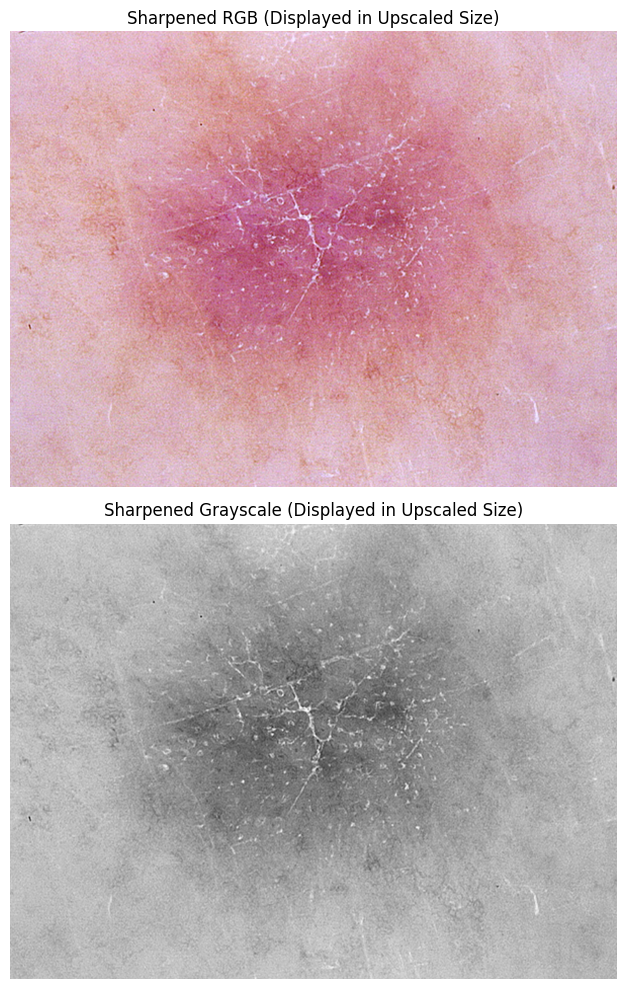

In [31]:
scale = 2.0

# Bicubic upscaling (INTER_CUBIC)
sharp_rgb_up = cv2.resize(
    sharp_rgb,
    None,
    fx=scale,
    fy=scale,
    interpolation=cv2.INTER_CUBIC
)

sharp_gray_up = cv2.resize(
    sharp_gray,
    None,
    fx=scale,
    fy=scale,
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
plt.imshow(sharp_rgb_up)
plt.title("Sharpened RGB (Displayed in Upscaled Size)")
plt.axis("off")

plt.subplot(2, 1, 2)
plt.imshow(sharp_gray_up, cmap="gray")
plt.title("Sharpened Grayscale (Displayed in Upscaled Size)")
plt.axis("off")

plt.tight_layout()
plt.show()

After bicubic upscaling, both the sharpened RGB and grayscale images preserve their overall visual structure while exhibiting smoother transitions between pixels. In the RGB image, the fine linear streaks and subtle color variations remain visible, although some of the sharpened high-frequency details appear slightly softened due to the interpolation process. The upscaled version still maintains good visual clarity, and the lesion’s central texture is well represented without introducing noticeable artifacts.

In the grayscale image, bicubic interpolation produces a clean enlargement with consistent tonal continuity. The branching white structures and the dark core of the lesion remain distinct, but their edges become marginally less sharp compared to the pre-upscaled sharpened image. This softening effect is expected because bicubic interpolation estimates new pixel values by averaging local neighborhoods, which smooths abrupt intensity transitions.

Overall, bicubic interpolation provides a high-quality upscale that retains the essential diagnostic features of the lesion while introducing only minimal smoothing. The method successfully enlarges the image without producing blockiness or aliasing, demonstrating its suitability for magnifying dermoscopic images for visual inspection.